In [1]:
%load_ext autoreload
%autoreload 2

from helper_rwi_iwi import *
import handlers as main

/home/fs71614/espinl/anaconda3/envs/tf2-gpu-2023/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string
2024-08-15 00:56:52.050210: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/fs71614/espinl/anaconda3/envs/tf2-gpu-2023/lib/:/home/fs71614/espinl/anaconda3/envs/tf2-gpu-2023/lib/python3.7/site-packages/nvidia/cudnn/lib
2024-08-15 00:56:52.050248: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2024-08-15 00:56:52.050264: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (l52.vsc.x

/home/fs71614/espinl/SES-Inference-internal/libs/utils


In [2]:
MAIN_ROOT = '../data'
MAIN_RESULTS = 'results'

In [3]:
RWI_PRED_PATH = '../resources/Facebook/RWI/' 
# <ccode3>_relative_wealth_index.csv: latitude, longitude, rwi, error

IWI_PRED_PATH = f'{MAIN_RESULTS}/pplaces_inference/' 
# <ccode2>_<model>_<years>_<features>.csv: OSMID, pred_mean_wi, pred_std_wi
# <ccode2>_features_<features>.csv: OSMID, lat, lon, rural, place, name, ... 

LEE_PRED_PATH = '../resources/worldbank/IWI/'
# <country>/<country>_estimated_wealth_index.csv.zip: lat, lon, estimated_IWI

BOUNDARY_FN = '../resources/geoBoundaries/<country>/geoBoundaries-<ccode3>-ADM<ADM>-all.zip'
ADMIN_LEVEL5 = 5
ADMIN_LEVEL4 = 4
ADMIN_LEVEL3 = 3
ADMIN_LEVEL2 = 2
ADMIN_LEVEL1 = 1
ADMIN_LEVEL0 = 0

GINI_FN = '../resources/worldbank/gini_index/API_SI.POV.GINI_DS2_en_csv_v2_16.csv'
GDP_FN = '../resources/worldbank/gdp_per_capita_USD/API_NY.GDP.PCAP.CD_DS2_en_csv_v2_184.csv'
OUTPUT_DIR = 'comparison-results'

In [4]:
# source rwi: https://www.pnas.org/doi/suppl/10.1073/pnas.2113658119/suppl_file/pnas.2113658119.sapp.pdf
SURVEY_YEAR = {'Sierra Leone':{'rwi':2013, 'iwi':None, 'lee':2016}, #iwi-lee: '2019,2016,2013,2008'
               'Liberia':{'rwi':2013, 'iwi':None, 'lee':2016}, #'2022,2019,2016,2013,2011'
               'Uganda':{'rwi':2016, 'iwi':None, 'lee':'2016,2018-19'}, #'2018,2016,2014,2011,2009'
               'Rwanda':{'rwi':'2014-15', 'iwi':None, 'lee':'2014-15'}, #'2019,2014,2010,2007,2005'
               'South Africa':{'rwi':2016, 'iwi':None, 'lee':2016},
               'Gabon':{'rwi':2012, 'iwi':None, 'lee':None}, #'2019,2012'               
              }

COUNTRY_ORDER = [c for c in ['Sierra Leone','Liberia','Uganda','Rwanda','South Africa','Gabon'] if c in SURVEY_YEAR.keys()]
NCOUNTRIES = len(SURVEY_YEAR)
for country,obj in SURVEY_YEAR.items():
    obj['iwi'] = COUNTRIES[country]['years']
    
SURVEY_YEAR['Uganda']['iwi']='2016,2018-19'
SURVEY_YEAR['South Africa']['iwi']=2016
NCOUNTRIES, SURVEY_YEAR  

(6,
 {'Sierra Leone': {'rwi': 2013, 'iwi': '2016,2019', 'lee': 2016},
  'Liberia': {'rwi': 2013, 'iwi': '2019,2022', 'lee': 2016},
  'Uganda': {'rwi': 2016, 'iwi': '2016,2018-19', 'lee': '2016,2018-19'},
  'Rwanda': {'rwi': '2014-15', 'iwi': '2019', 'lee': '2014-15'},
  'South Africa': {'rwi': 2016, 'iwi': 2016, 'lee': 2016},
  'Gabon': {'rwi': 2012, 'iwi': '2019', 'lee': None}})

In [5]:
model = None #'CB'
features_source = 'OCI_FBP_NTLL_OSM'
RESCALE = True
IMG_QUALITY = 300 # 300 HQ

figsize = (10,10)
kwargs_raw_map = {'figsize':figsize, 'markersize':0.5, 'cmap':'RdYlBu', 'legend':True, 'title':True, 'suptitle':False, 'kind':None, 'legend_kwds':{'shrink': 0.2}, 'years':SURVEY_YEAR, 'dpi':IMG_QUALITY} 
kwargs_mean = {'figsize':figsize, 'markersize':0.5, 'cmap':'BrBG', 'legend':True, 'title':True, 'suptitle':False, 'kind':'mean', 'legend_kwds':{'shrink': 0.2}, 'years':SURVEY_YEAR, 'dpi':IMG_QUALITY} 
kwargs_rescale = {'figsize':figsize, 'markersize':0.5, 'cmap':'BrBG', 'legend':True, 'title':True, 'suptitle':False, 'kind':'rescale', 'legend_kwds':{'shrink': 0.2}, 'samecolorbar':True, 'years':SURVEY_YEAR, 'dpi':IMG_QUALITY} 
kwargs_rescale_mean = {'figsize':figsize, 'markersize':0.5, 'cmap':'BrBG', 'legend':True, 'title':True, 'suptitle':False, 'kind':'rescale_mean', 'legend_kwds':{'shrink': 0.2}, 'samecolorbar':True, 'years':SURVEY_YEAR, 'dpi':IMG_QUALITY} 
kwargs_admin = {'figsize':figsize, 'cmap':'BrBG', 'legend':True, 'title':True, 'suptitle':False, 'kind':'rescale_mean', 'legend_kwds':{'shrink': 0.2, 'location': 'right'}, 'samecolorbar':True, 'years':SURVEY_YEAR, 'dpi':IMG_QUALITY} 

figsize = (10,4)
kwargs_dist = {'figsize':figsize, 'title':True, 'suptitle':False, 'years':SURVEY_YEAR, 'dpi':IMG_QUALITY}

figsize = (10,4)
MAX_DISTANCE_OVERLAP = 500
kwargs_overlap = {'figsize':figsize, 'suptitle':False, 'legend_kwds':{'shrink': 0.4}, 'markersize':4, 'max_distance':MAX_DISTANCE_OVERLAP, 'years':SURVEY_YEAR, 'dpi':IMG_QUALITY}


In [6]:
import seaborn as sns
sns.set_style("white")
sns.set_context("paper", font_scale = 1.6, rc={"grid.linewidth": 0.6})

# Preliminaries

../resources/worldbank/gini_index/API_SI.POV.GINI_DS2_en_csv_v2_16.csv loaded!
../resources/worldbank/gdp_per_capita_USD/API_NY.GDP.PCAP.CD_DS2_en_csv_v2_184.csv loaded!
comparison-results/data_preliminaries.tex saved!
comparison-results/data_preliminaries.pdf saved!


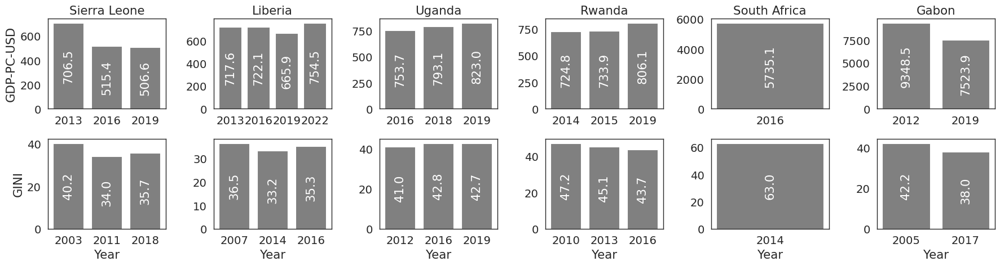

In [7]:
df_preliminaries = show_preliminaries(GINI_FN, GDP_FN, SURVEY_YEAR, OUTPUT_DIR)

df_preliminaries['country'] = pd.Categorical(df_preliminaries['country'], categories=COUNTRY_ORDER, ordered=True)
df_preliminaries = df_preliminaries.sort_values('country')

plot_preliminaries(df_preliminaries, OUTPUT_DIR, figsize=(NCOUNTRIES*3,5), suptitle=False)

In [8]:
df_preliminaries

,country,year_survey,_gini,gdp,in_rwi,in_lee,in_iwi,actual_gini,actual_year
0,Sierra Leone,2013,40.2 (2003),706.452682,True,False,False,40.2,2003
1,Sierra Leone,2016,34.0 (2011),515.447840,False,True,True,34.0,2011
2,Sierra Leone,2019,35.7 (2018),506.606914,False,False,True,35.7,2018
3,Liberia,2013,36.5 (2007),717.635753,True,False,False,36.5,2007
4,Liberia,2016,33.2 (2014),722.131227,False,True,False,33.2,2014
5,Liberia,2019,35.3 (2016),665.878448,False,False,True,35.3,2016
6,Liberia,2022,None,754.532843,False,False,True,NaN,2022
7,Uganda,2016,41.0 (2012),753.684406,True,True,True,41.0,2012
8,Uganda,2018,42.8 (2016),793.128082,False,True,True,42.8,2016
9,Uganda,2019,42.7 (2019),823.024733,False,True,True,42.7,2019


In [9]:
df_expectations = show_expected_differences(df_preliminaries, OUTPUT_DIR)
df_expectations

IWI: Sierra Leone 2018
RWI: Sierra Leone 2003
LEE: Sierra Leone 2011
IWI: Liberia 2016
RWI: Liberia 2007
LEE: Liberia 2014
IWI: Uganda 2019
RWI: Uganda 2012
LEE: Uganda 2019
IWI: Rwanda 2016
RWI: Rwanda 2013
LEE: Rwanda 2013
IWI: South Africa 2014
RWI: South Africa 2014
LEE: South Africa 2014
IWI: Gabon 2017
RWI: Gabon 2005
LEE: Gabon nan
comparison-results/data_expectations.tex saved!


,gini_rwi_iwi,gini_lee_iwi,gdp_rwi_iwi,gdp_lee_iwi,gini_rwi_iwi_value,gini_lee_iwi_value,gdp_rwi_iwi_value,gdp_lee_iwi_value
country,,,,,,,,
Sierra Leone,similar or slightly higher Gini,similar or slightly lower Gini,higher GDP (richer),similar or slightly higher GDP,4.5,-1.7,0.164745,0.00865
Liberia,similar or slightly higher Gini,similar or slightly lower Gini,similar or slightly higher GDP,similar or slightly higher GDP,1.2,-2.1,0.037410,0.040528
Uganda,similar or slightly lower Gini,very similar Gini,similar or slightly lower GDP,similar GDP,-1.7,0.0,-0.043978,0.0
Rwanda,similar or slightly higher Gini,similar or slightly higher Gini,similar or slightly lower GDP,similar or slightly lower GDP,1.4,1.4,-0.046892,-0.046892
South Africa,very similar Gini,very similar Gini,similar GDP,similar GDP,0.0,0.0,0.000000,0.0
Gabon,similar or slightly higher Gini,NA,higher GDP (richer),NA,4.2,None,0.108144,None


In [10]:
print(df_expectations[['gdp_rwi_iwi','gdp_lee_iwi','gini_rwi_iwi','gini_lee_iwi']].to_latex())

\begin{tabular}{lllll}
\toprule
{} &                     gdp\_rwi\_iwi &                     gdp\_lee\_iwi &                     gini\_rwi\_iwi &                     gini\_lee\_iwi \\
country      &                                 &                                 &                                  &                                  \\
\midrule
Sierra Leone &             higher GDP (richer) &  similar or slightly higher GDP &  similar or slightly higher Gini &   similar or slightly lower Gini \\
Liberia      &  similar or slightly higher GDP &  similar or slightly higher GDP &  similar or slightly higher Gini &   similar or slightly lower Gini \\
Uganda       &   similar or slightly lower GDP &                     similar GDP &   similar or slightly lower Gini &                very similar Gini \\
Rwanda       &   similar or slightly lower GDP &   similar or slightly lower GDP &  similar or slightly higher Gini &  similar or slightly higher Gini \\
South Africa &                     si

# Summary

In [11]:
df_rs = main.get_residuals(root=MAIN_ROOT, countries=COUNTRY_ORDER, output=MAIN_RESULTS)
df_dr = main.get_performance_from_predictions(df_rs=df_rs, output=MAIN_RESULTS)

metric = 'rmse'
best_models = main.select_best_model(df_dr, features_source, metric, COUNTRY_ORDER)

best_models = best_models['model'].to_dict()
best_models

{'Sierra Leone': 'CB',
 'Liberia': 'CB',
 'Uganda': 'CB$_w$',
 'Rwanda': 'CB$_w$',
 'South Africa': 'CNN$_a$+CB',
 'Gabon': 'CNN$_a$+CB'}

In [12]:
df_summary = show_final_summary(df_preliminaries, df_expectations, SURVEY_YEAR, best_models, features_source, RWI_PRED_PATH, LEE_PRED_PATH, IWI_PRED_PATH, MAX_DISTANCE_OVERLAP, OUTPUT_DIR)
df_summary

Sierra Leone CB
Liberia CB
Uganda CB$_w$
Rwanda CB$_w$
South Africa CNN$_a$+CB
Gabon CNN$_a$+CB
comparison-results/summary.tex saved!


,country,chi_years,chi_n,chi_mean,chi_std,chi_gini,lee_years,lee_n,lee_mean,lee_std,...,overlap_lee_rmse,overlap_lee_mean_rwi,overlap_lee_mean_iwi,overlap_lee_mean_diff,overlap_lee_mean_diff_norm,overlap_lee_mean_ztest,overlap_lee_mean_ro,overlap_lee_gini_rwi,overlap_lee_gini_iwi,overlap_lee_gini_diff
0,Sierra Leone,2013,8435,29.124649,4.924513,8.791726,2016,13040,18.925030,10.335924,...,6.893904,19.383705,22.969779,3.586073,0.084670,22.673627,0.87 ***,24.573267,14.234121,10.339146
1,Liberia,2013,6189,28.616764,3.710163,6.723028,2016,16525,14.567596,8.790917,...,11.058480,13.965077,23.653584,9.688507,0.257545,134.517124,0.74 ***,24.021129,8.356994,15.664135
2,Uganda,2016,25404,41.347011,3.064178,3.924669,"2016,2018-19",27482,22.267965,11.258861,...,19.578070,24.969249,42.191361,17.222112,0.256432,136.615734,0.82 ***,26.927024,6.461150,20.465873
3,Rwanda,2014-15,3715,45.813629,2.929677,3.384547,2014-15,23323,24.397476,14.514840,...,21.774418,32.750200,49.257114,16.506914,0.201286,40.786054,0.43 ***,26.173807,4.987146,21.186661
4,South Africa,2016,39072,48.946606,8.593619,9.693861,2016,22687,61.140341,18.098782,...,22.775832,66.929429,51.378801,-15.550628,-0.131442,-37.515454,0.45 ***,15.079194,14.557222,0.521972
5,Gabon,2012,1110,51.395892,5.154983,5.320614,None,4835,21.890469,8.859387,...,25.210382,24.920288,48.226502,23.306214,0.318623,38.178454,0.73 ***,25.371309,7.308083,18.063226


In [13]:
print(df_summary[['country','chi_years','lee_years','us_years']].set_index('country').to_latex())

\begin{tabular}{llll}
\toprule
{} & chi\_years &     lee\_years &      us\_years \\
country      &           &               &               \\
\midrule
Sierra Leone &      2013 &          2016 &     2016,2019 \\
Liberia      &      2013 &          2016 &     2019,2022 \\
Uganda       &      2016 &  2016,2018-19 &  2016,2018-19 \\
Rwanda       &   2014-15 &       2014-15 &          2019 \\
South Africa &      2016 &          2016 &          2016 \\
Gabon        &      2012 &          None &          2019 \\
\bottomrule
\end{tabular}



In [14]:
print(df_summary.set_index('country')[['chi_n','chi_mean','chi_std','chi_gini',
                                       'lee_n','lee_mean','lee_std','lee_gini',
                                       'us_n','us_mean','us_std','us_gini']].round(2).to_latex())

\begin{tabular}{llrrrlrrrlrrr}
\toprule
{} &  chi\_n &  chi\_mean &  chi\_std &  chi\_gini &  lee\_n &  lee\_mean &  lee\_std &  lee\_gini &   us\_n &  us\_mean &  us\_std &  us\_gini \\
country      &        &           &          &           &        &           &          &           &        &          &         &          \\
\midrule
Sierra Leone &   8435 &     29.12 &     4.92 &      8.79 &  13040 &     18.93 &    10.34 &     23.01 &   9881 &    21.87 &    6.09 &    11.54 \\
Liberia      &   6189 &     28.62 &     3.71 &      6.72 &  16525 &     14.57 &     8.79 &     25.93 &  15597 &    23.35 &    3.74 &     7.75 \\
Uganda       &  25404 &     41.35 &     3.06 &      3.92 &  27482 &     22.27 &    11.26 &     25.09 &  27791 &    41.83 &    5.21 &     5.95 \\
Rwanda       &   3715 &     45.81 &     2.93 &      3.38 &  23323 &     24.40 &    14.51 &     28.96 &   1150 &    47.79 &    3.46 &     3.74 \\
South Africa &  39072 &     48.95 &     8.59 &      9.69 &  22687 &     61.14 &

In [15]:
print(df_summary.set_index('country')[['diff_chi_wealth_expected','diff_chi_wealth_obtained','diff_chi_gini_expected','diff_chi_gini_obtained','ks_rwi_iwi',
                                       'diff_lee_wealth_expected','diff_lee_wealth_obtained','diff_lee_gini_expected','diff_lee_gini_obtained','ks_lee_iwi']].round(2).to_latex())

\begin{tabular}{lrrrrllrlrl}
\toprule
{} &  diff\_chi\_wealth\_expected &  diff\_chi\_wealth\_obtained &  diff\_chi\_gini\_expected &  diff\_chi\_gini\_obtained & ks\_rwi\_iwi & diff\_lee\_wealth\_expected &  diff\_lee\_wealth\_obtained & diff\_lee\_gini\_expected &  diff\_lee\_gini\_obtained & ks\_lee\_iwi \\
country      &                           &                           &                         &                         &            &                          &                           &                        &                         &            \\
\midrule
Sierra Leone &                      0.16 &                      0.14 &                     4.5 &                   -2.75 &      0.74  &                  0.00865 &                     -0.07 &                   -1.7 &                   11.47 &   0.62 *** \\
Liberia      &                      0.04 &                      0.10 &                     1.2 &                   -1.02 &   0.67 *** &                 0.040528 &     

In [16]:
cols = ['overlap_chi_n', 'overlap_chi_rmse', 'overlap_chi_mean_ro', 'overlap_chi_mean_diff_norm', 'overlap_chi_gini_diff',
        'overlap_lee_n', 'overlap_lee_rmse', 'overlap_lee_mean_ro', 'overlap_lee_mean_diff_norm', 'overlap_lee_gini_diff']

print(df_summary.set_index('country')[cols].round(2).to_latex())

\begin{tabular}{llrlrrlrlrr}
\toprule
{} & overlap\_chi\_n &  overlap\_chi\_rmse & overlap\_chi\_mean\_ro &  overlap\_chi\_mean\_diff\_norm &  overlap\_chi\_gini\_diff & overlap\_lee\_n &  overlap\_lee\_rmse & overlap\_lee\_mean\_ro &  overlap\_lee\_mean\_diff\_norm &  overlap\_lee\_gini\_diff \\
country      &               &                   &                     &                             &                        &               &                   &                     &                             &                        \\
\midrule
Sierra Leone &          1125 &              9.72 &            0.69 *** &                       -0.16 &                  -1.08 &          7264 &              6.89 &            0.87 *** &                        0.08 &                  10.34 \\
Liberia      &          1332 &              6.59 &            0.53 *** &                       -0.11 &                  -0.51 &         14609 &             11.06 &            0.74 *** &                        

# Sierra Leone

In [17]:
country = 'Sierra Leone'
gdf_rwi, gdf_lee, gdf_iwi = load_rwi_lee_iwi(country, best_models[country], features_source, RWI_PRED_PATH, LEE_PRED_PATH, IWI_PRED_PATH, rescale=RESCALE)

comparison-results/maps_SLE_None.pdf saved!


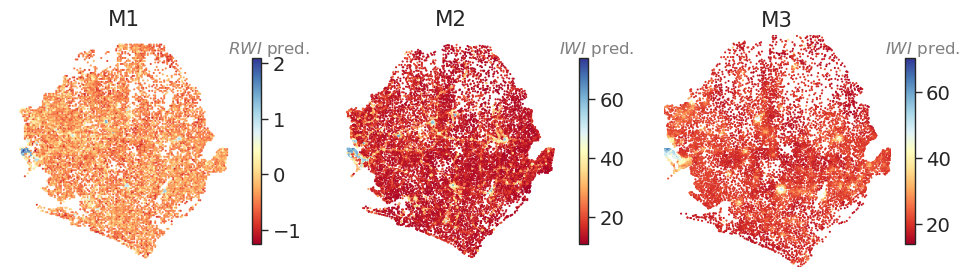

In [18]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_raw_map)

comparison-results/maps_SLE_mean.pdf saved!


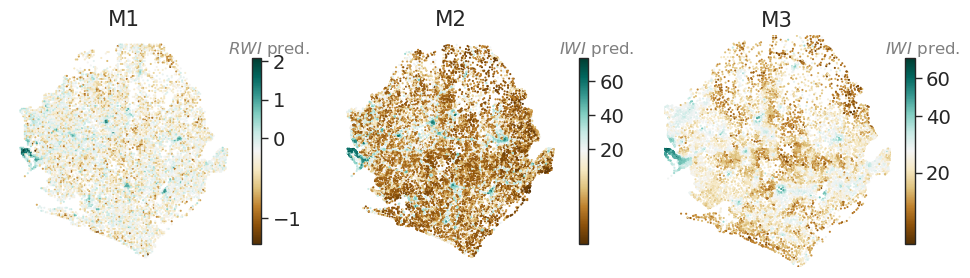

In [19]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_mean)

comparison-results/maps_SLE_rescale.pdf saved!


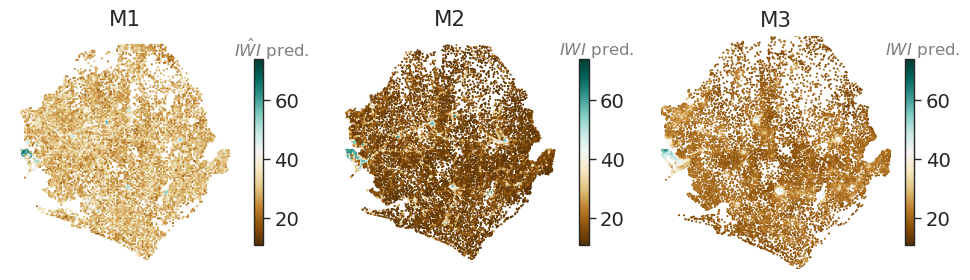

In [20]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_rescale)

comparison-results/maps_SLE_rescale_mean.pdf saved!


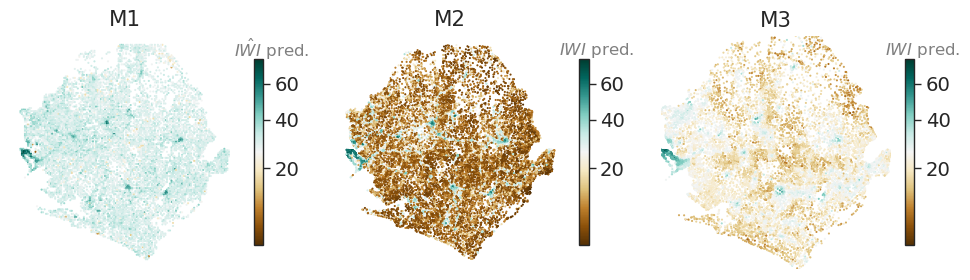

In [21]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_rescale_mean)

comparison-results/maps_SLE_rescale_mean_admin2.pdf saved!


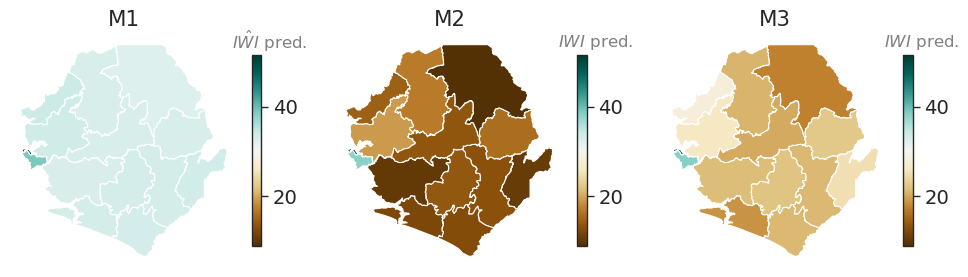

In [22]:
plot_comparison_admin_maps(gdf_rwi, gdf_lee, gdf_iwi, country, BOUNDARY_FN, ADMIN_LEVEL2, OUTPUT_DIR, **kwargs_admin)

comparison-results/maps_SLE_rescale_mean_admin1.pdf saved!


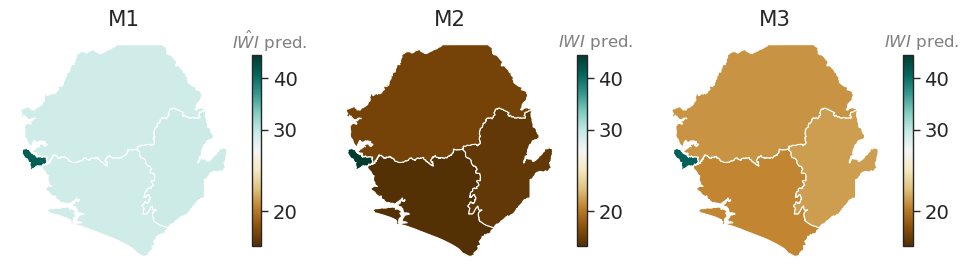

In [23]:
plot_comparison_admin_maps(gdf_rwi, gdf_lee, gdf_iwi, country, BOUNDARY_FN, ADMIN_LEVEL1, OUTPUT_DIR, **kwargs_admin)

comparison-results/dist_SLE.pdf saved!


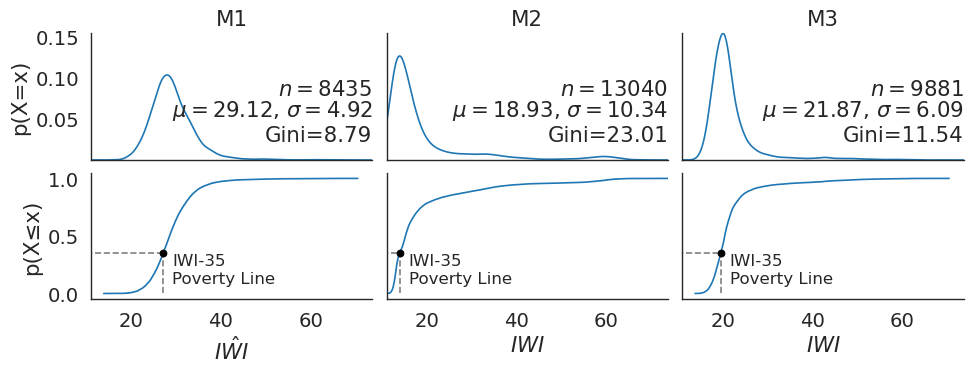

In [24]:
plot_comparison_dist(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_dist)

[WARNING] 1125 1121 1125 computing mean...
comparison-results/samecells_SLE_iwi_rwi.pdf saved!


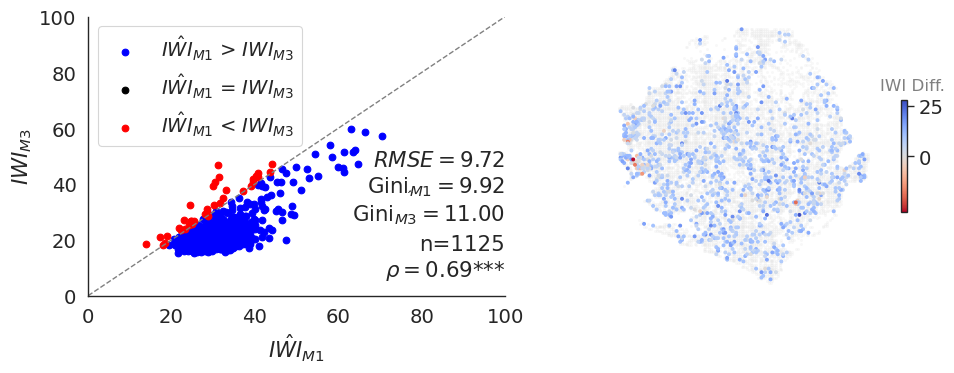

In [25]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee, gdf_iwi=gdf_iwi, sources=('iwi','rwi'), country=country, output_dir=OUTPUT_DIR, **kwargs_overlap)

[WARNING] 7264 7248 6199 computing mean...
comparison-results/samecells_SLE_iwi_lee.pdf saved!


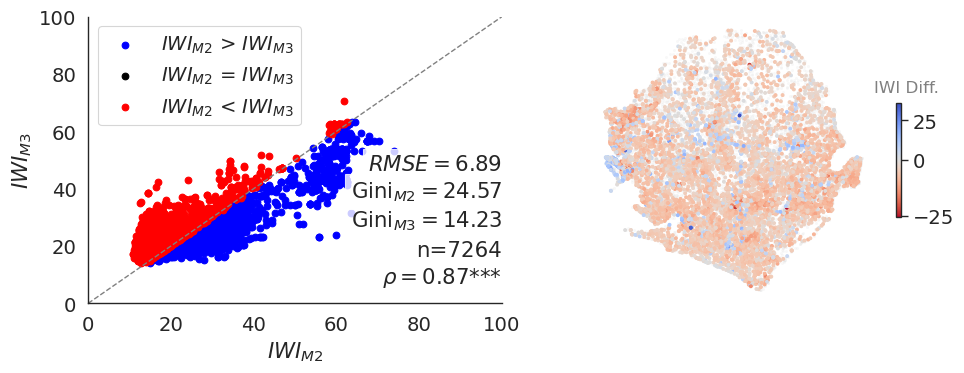

In [26]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee, gdf_iwi=gdf_iwi, sources=('iwi','lee'), country=country, output_dir=OUTPUT_DIR, **kwargs_overlap)

[WARNING] 1428 1353 1428 computing mean...
comparison-results/samecells_SLE_lee_rwi.pdf saved!


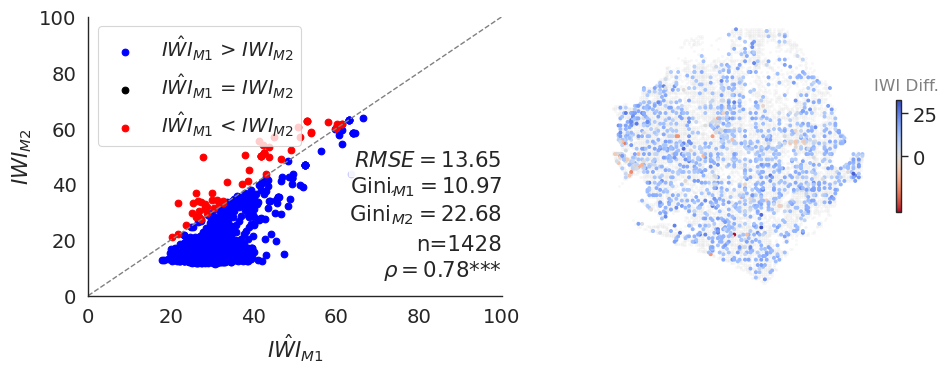

In [27]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee, gdf_iwi=gdf_iwi, sources=('lee','rwi'), country=country, output_dir=OUTPUT_DIR, **kwargs_overlap)

# Liberia

In [28]:
country = 'Liberia'
gdf_rwi, gdf_lee, gdf_iwi = load_rwi_lee_iwi(country, best_models[country], features_source, RWI_PRED_PATH, LEE_PRED_PATH, IWI_PRED_PATH, rescale=RESCALE)

comparison-results/maps_LBR_None.pdf saved!


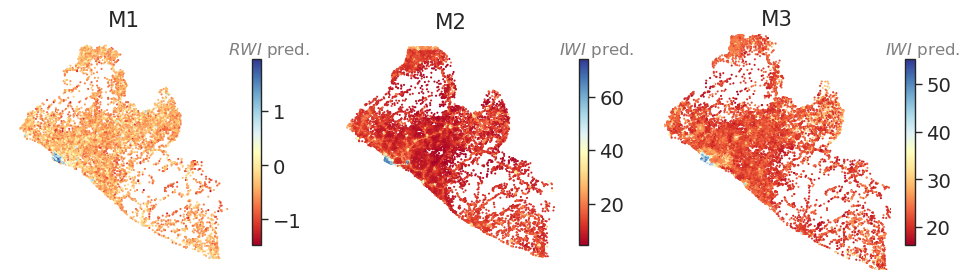

In [29]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_raw_map)

comparison-results/maps_LBR_mean.pdf saved!


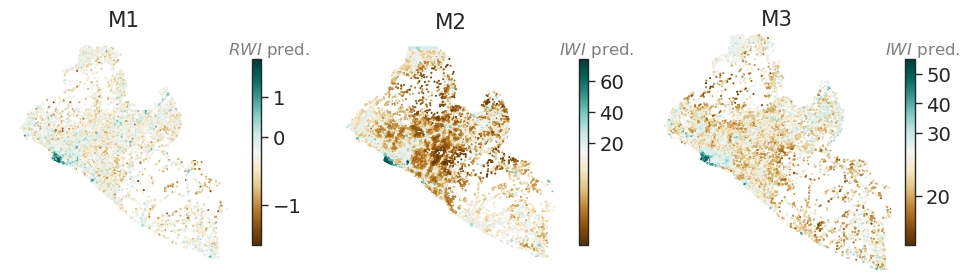

In [30]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_mean)

comparison-results/maps_LBR_rescale.pdf saved!


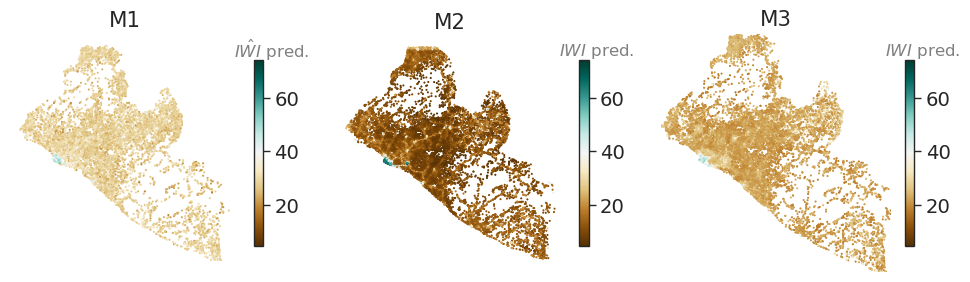

In [31]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_rescale)

comparison-results/maps_LBR_rescale_mean.pdf saved!


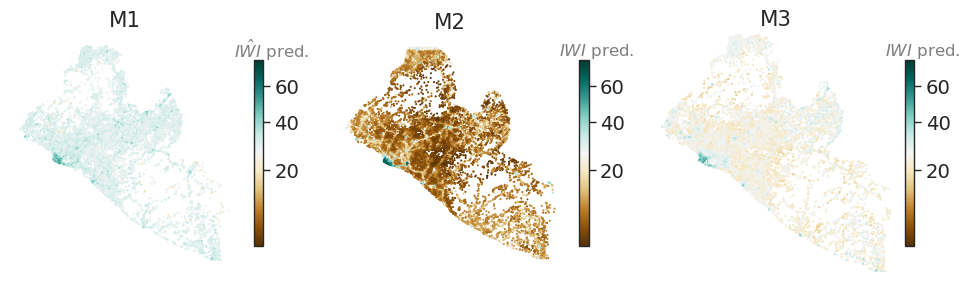

In [32]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_rescale_mean)

comparison-results/maps_LBR_rescale_mean_admin2.pdf saved!


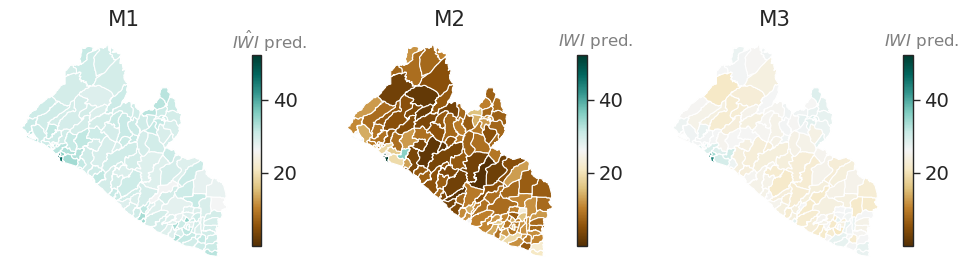

In [33]:
plot_comparison_admin_maps(gdf_rwi, gdf_lee, gdf_iwi, country, BOUNDARY_FN, ADMIN_LEVEL2, OUTPUT_DIR, **kwargs_admin)

comparison-results/maps_LBR_rescale_mean_admin2.pdf saved!


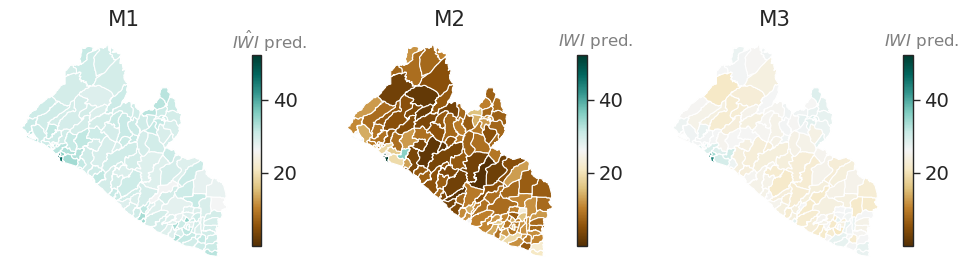

In [34]:
plot_comparison_admin_maps(gdf_rwi, gdf_lee, gdf_iwi, country, BOUNDARY_FN, ADMIN_LEVEL2, OUTPUT_DIR, **kwargs_admin)

comparison-results/maps_LBR_rescale_mean_admin1.pdf saved!


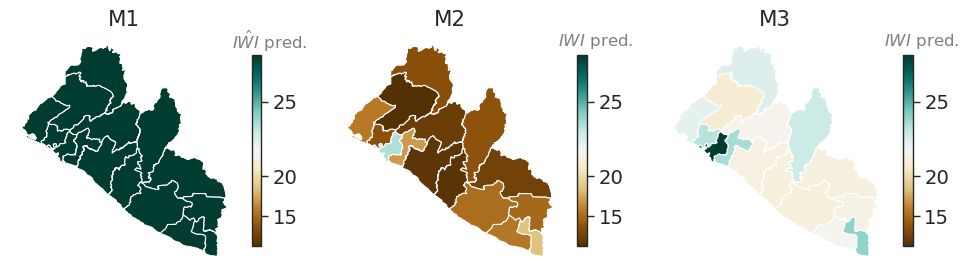

In [35]:
plot_comparison_admin_maps(gdf_rwi, gdf_lee, gdf_iwi, country, BOUNDARY_FN, ADMIN_LEVEL1, OUTPUT_DIR, **kwargs_admin)

comparison-results/dist_LBR.pdf saved!


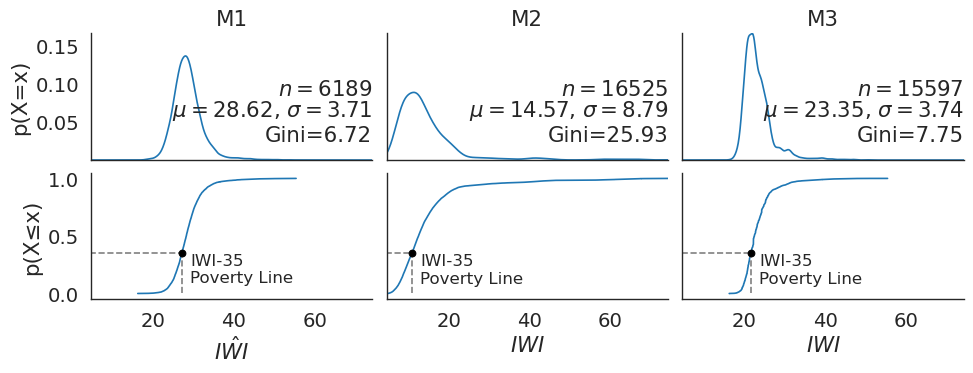

In [36]:
plot_comparison_dist(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_dist)

comparison-results/samecells_LBR_iwi_rwi.pdf saved!


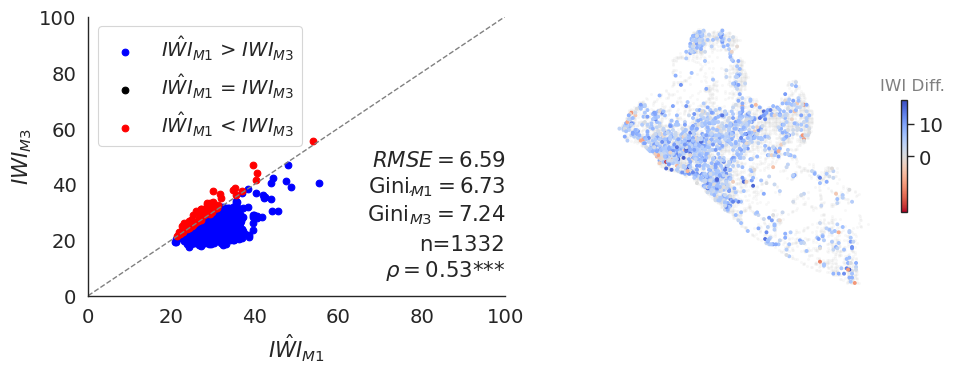

In [37]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee, gdf_iwi=gdf_iwi, country=country, sources=('iwi','rwi'), output_dir=OUTPUT_DIR, **kwargs_overlap)

[WARNING] 14609 14600 13764 computing mean...
comparison-results/samecells_LBR_iwi_lee.pdf saved!


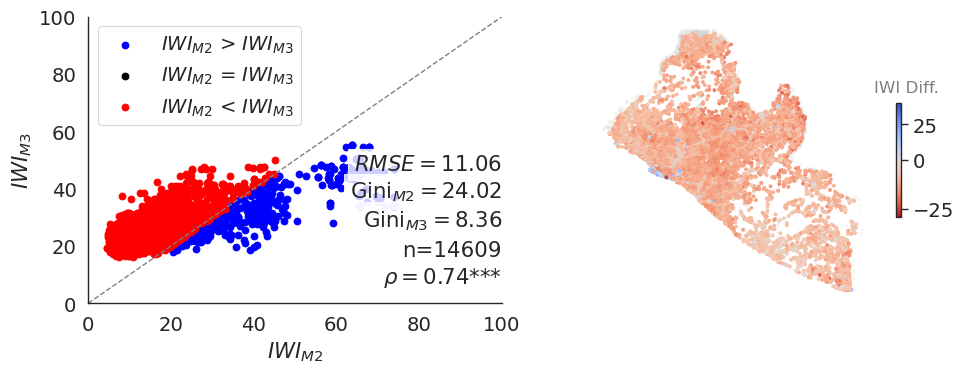

In [38]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee, gdf_iwi=gdf_iwi, country=country, sources=('iwi','lee'), output_dir=OUTPUT_DIR, **kwargs_overlap)

[WARNING] 1360 1345 1360 computing mean...
comparison-results/samecells_LBR_lee_rwi.pdf saved!


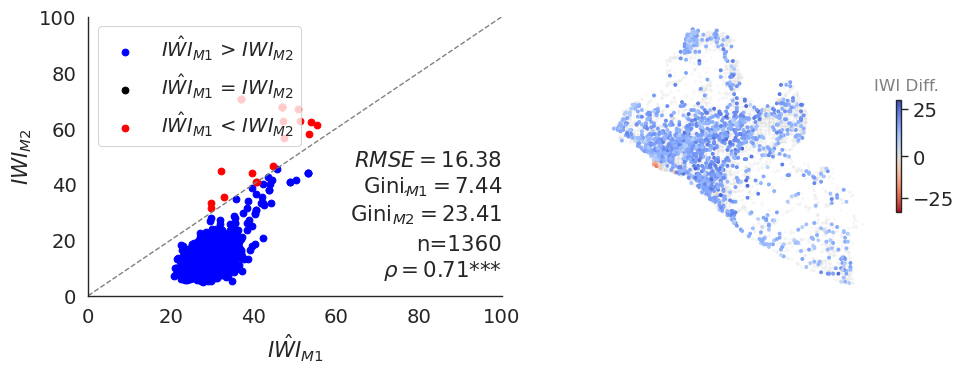

In [39]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee, gdf_iwi=gdf_iwi, country=country, sources=('lee','rwi'), output_dir=OUTPUT_DIR, **kwargs_overlap)

# Uganda

In [40]:
country = 'Uganda'
gdf_rwi, gdf_lee, gdf_iwi = load_rwi_lee_iwi(country, best_models[country], features_source, RWI_PRED_PATH, LEE_PRED_PATH, IWI_PRED_PATH, rescale=RESCALE)

comparison-results/maps_UGA_None.pdf saved!


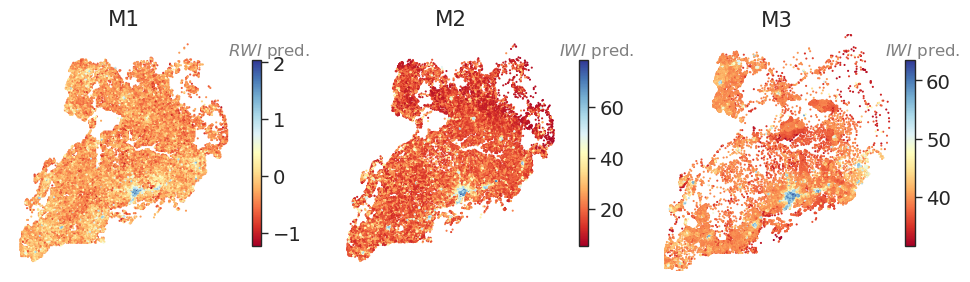

In [41]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_raw_map)

comparison-results/maps_UGA_mean.pdf saved!


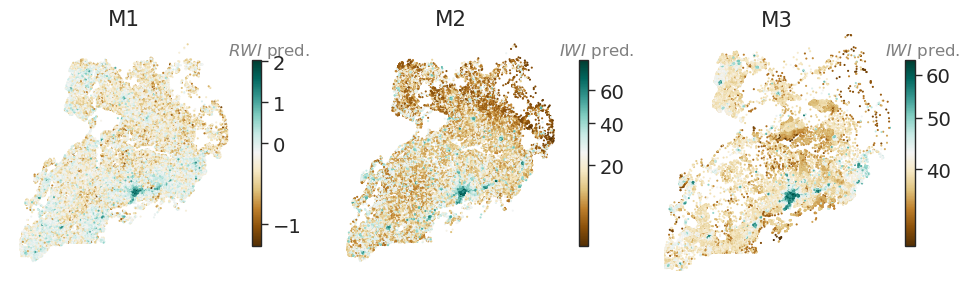

In [42]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_mean)

comparison-results/maps_UGA_rescale.pdf saved!


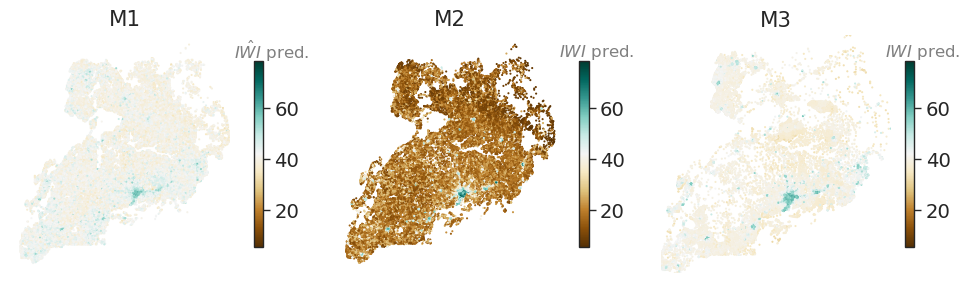

In [43]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_rescale)

comparison-results/maps_UGA_rescale_mean.pdf saved!


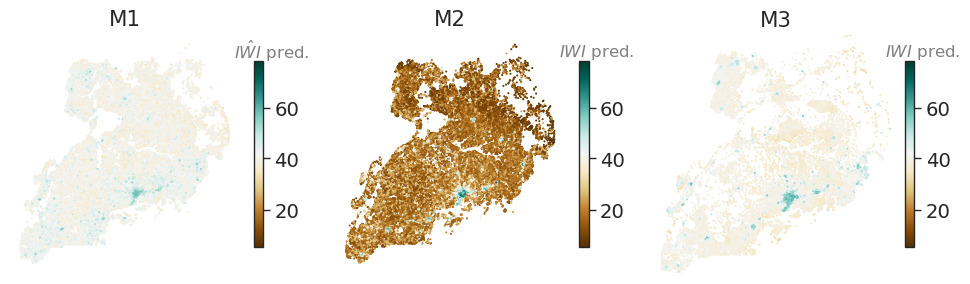

In [44]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_rescale_mean)

comparison-results/maps_UGA_rescale_mean_admin2.pdf saved!


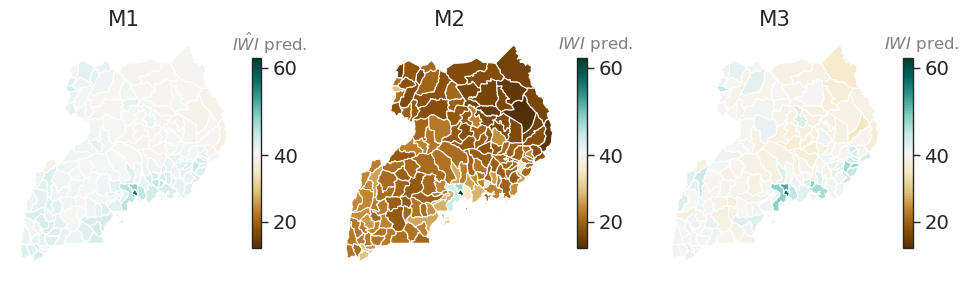

In [45]:
plot_comparison_admin_maps(gdf_rwi, gdf_lee, gdf_iwi, country, BOUNDARY_FN, ADMIN_LEVEL2, OUTPUT_DIR, **kwargs_admin)

comparison-results/maps_UGA_rescale_mean_admin1.pdf saved!


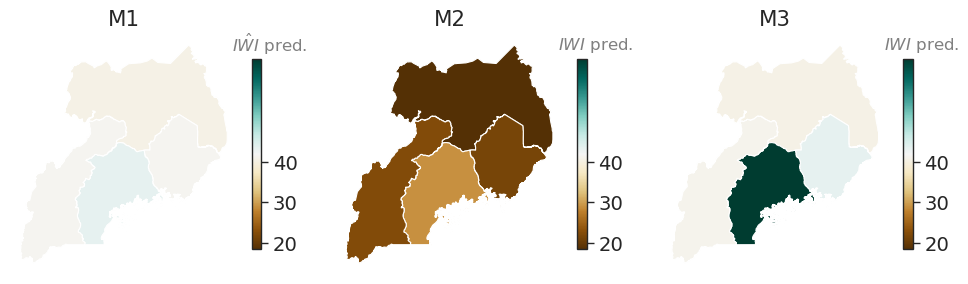

In [46]:
plot_comparison_admin_maps(gdf_rwi, gdf_lee, gdf_iwi, country, BOUNDARY_FN, ADMIN_LEVEL1, OUTPUT_DIR, **kwargs_admin)

comparison-results/dist_UGA.pdf saved!


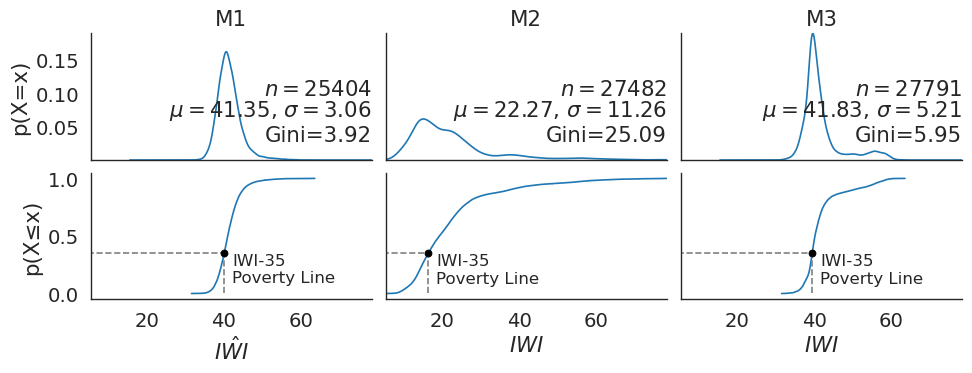

In [47]:
plot_comparison_dist(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_dist)

[WARNING] 2799 2778 2799 computing mean...
comparison-results/samecells_UGA_iwi_rwi.pdf saved!


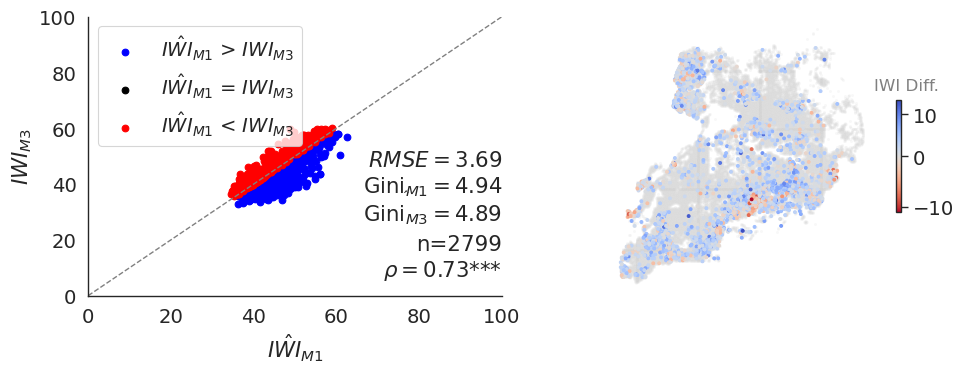

In [48]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee, gdf_iwi=gdf_iwi, country=country, sources=('iwi','rwi'), output_dir=OUTPUT_DIR, **kwargs_overlap)

[WARNING] 13057 13035 10937 computing mean...
comparison-results/samecells_UGA_iwi_lee.pdf saved!


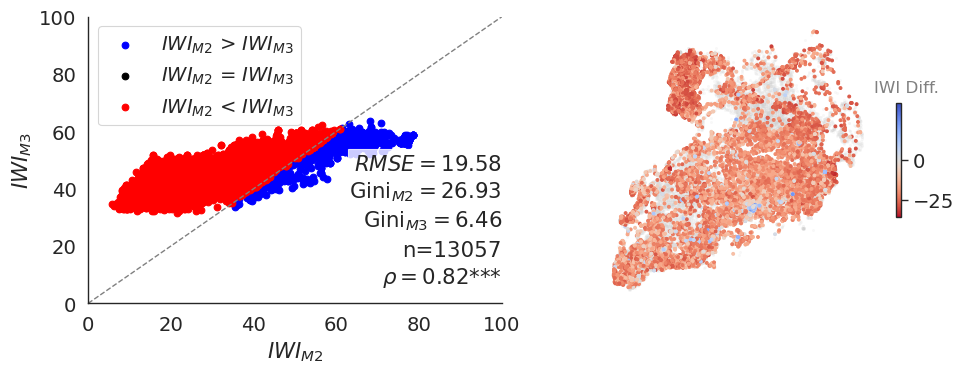

In [49]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee, gdf_iwi=gdf_iwi, country=country, sources=('iwi','lee'), output_dir=OUTPUT_DIR, **kwargs_overlap)

[WARNING] 2989 2722 2989 computing mean...
comparison-results/samecells_UGA_lee_rwi.pdf saved!


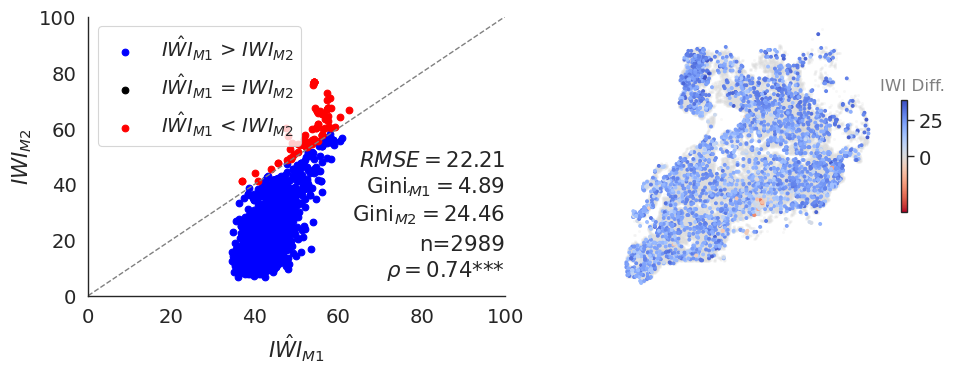

In [50]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee, gdf_iwi=gdf_iwi, country=country, sources=('lee','rwi'), output_dir=OUTPUT_DIR, **kwargs_overlap)

# Rwanda

In [51]:
country = 'Rwanda'
gdf_rwi, gdf_lee, gdf_iwi = load_rwi_lee_iwi(country, best_models[country], features_source, RWI_PRED_PATH, LEE_PRED_PATH, IWI_PRED_PATH, rescale=RESCALE)

comparison-results/maps_RWA_None.pdf saved!


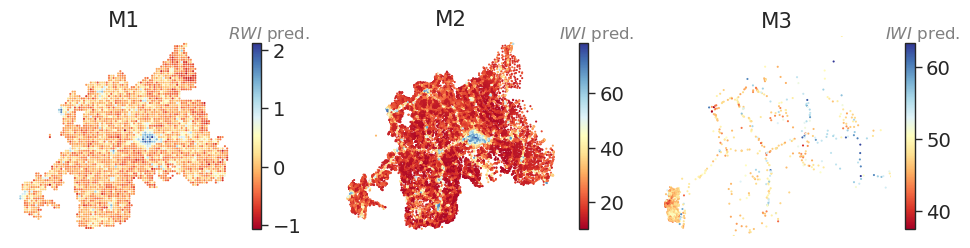

In [52]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_raw_map)

comparison-results/maps_RWA_mean.pdf saved!


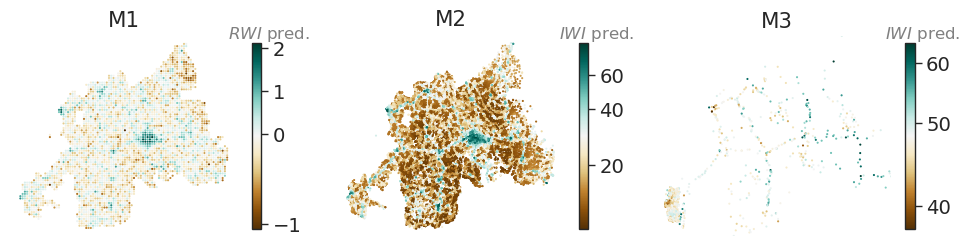

In [53]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_mean)

comparison-results/maps_RWA_rescale.pdf saved!


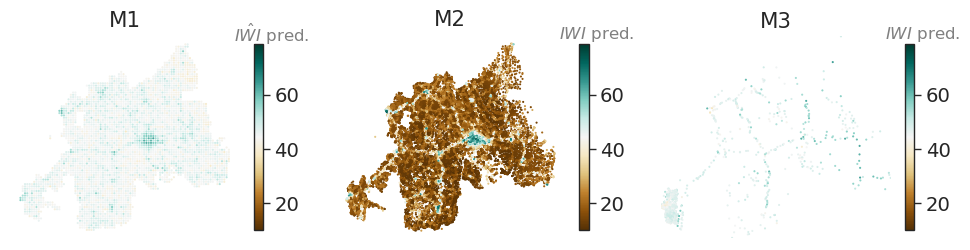

In [54]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_rescale)

comparison-results/maps_RWA_rescale_mean.pdf saved!


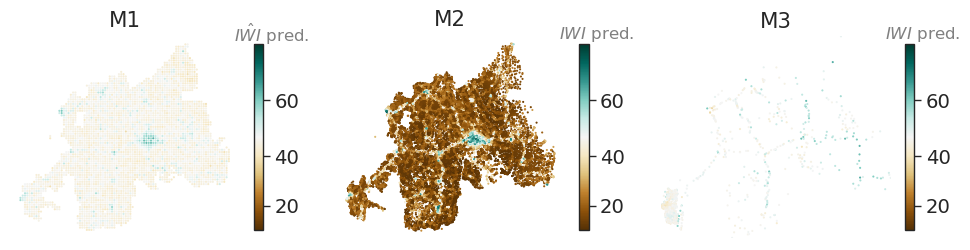

In [55]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_rescale_mean)

comparison-results/maps_RWA_rescale_mean_admin2.pdf saved!


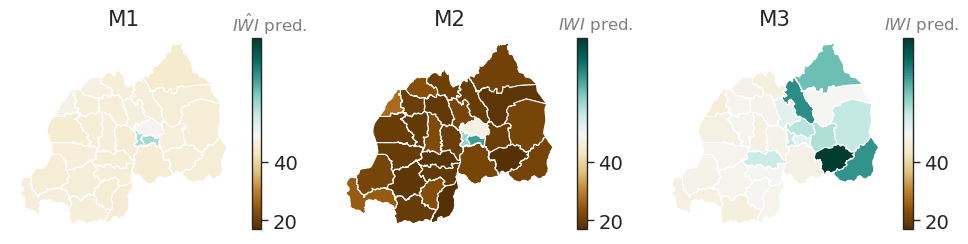

In [56]:
plot_comparison_admin_maps(gdf_rwi, gdf_lee, gdf_iwi, country, BOUNDARY_FN, ADMIN_LEVEL2, OUTPUT_DIR, **kwargs_admin)

comparison-results/maps_RWA_rescale_mean_admin1.pdf saved!


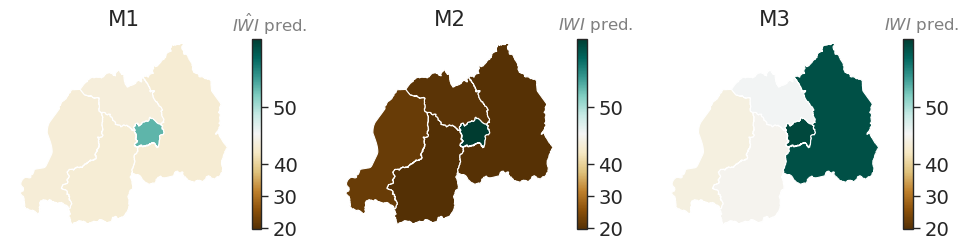

In [57]:
plot_comparison_admin_maps(gdf_rwi, gdf_lee, gdf_iwi, country, BOUNDARY_FN, ADMIN_LEVEL1, OUTPUT_DIR, **kwargs_admin)

comparison-results/dist_RWA.pdf saved!


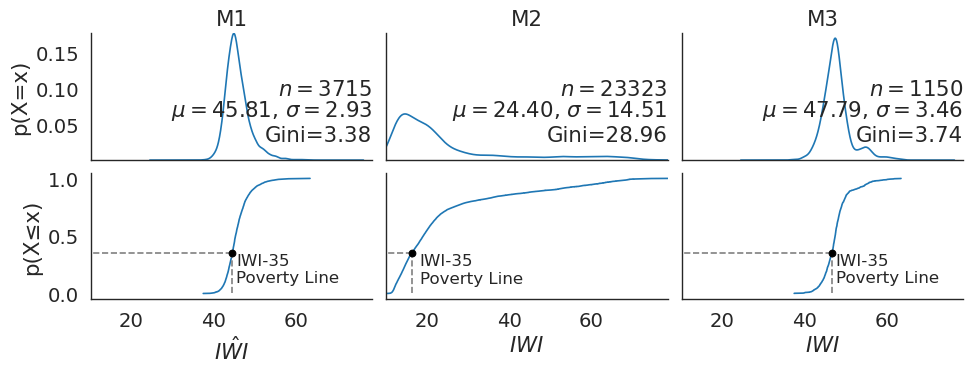

In [58]:
plot_comparison_dist(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_dist)

comparison-results/samecells_RWA_iwi_rwi.pdf saved!


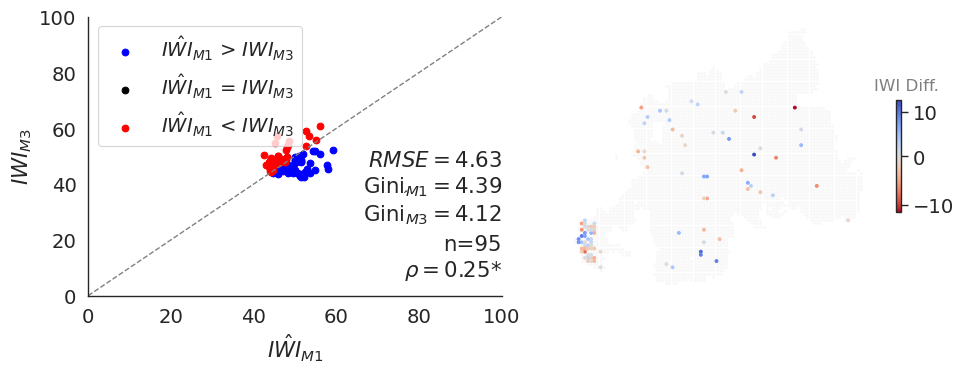

In [59]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee, gdf_iwi=gdf_iwi, country=country, sources=('iwi','rwi'), output_dir=OUTPUT_DIR, **kwargs_overlap)

[WARNING] 1603 1603 653 computing mean...
comparison-results/samecells_RWA_iwi_lee.pdf saved!


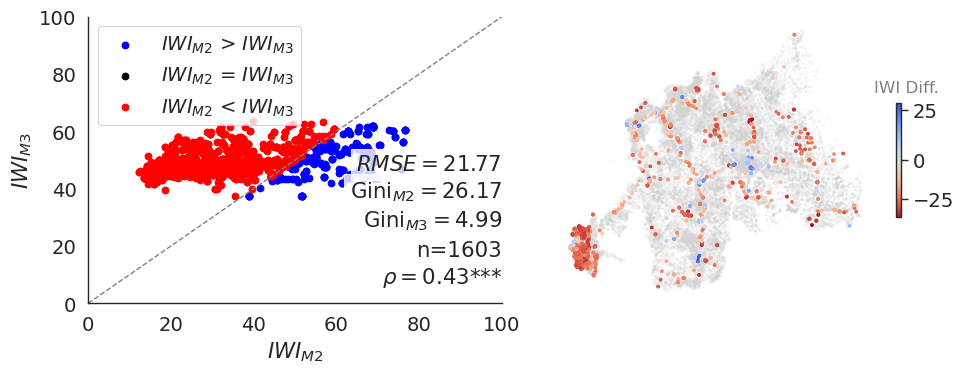

In [60]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee, gdf_iwi=gdf_iwi, country=country, sources=('iwi','lee'), output_dir=OUTPUT_DIR, **kwargs_overlap)

[WARNING] 2193 1364 2193 computing mean...
comparison-results/samecells_RWA_lee_rwi.pdf saved!


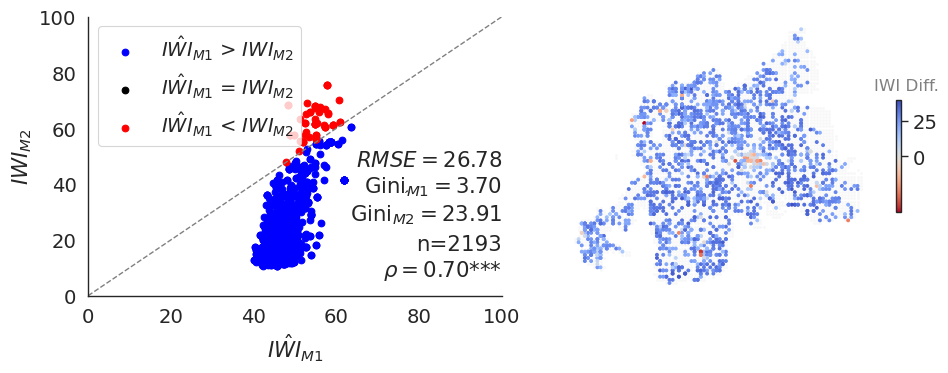

In [61]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee, gdf_iwi=gdf_iwi, country=country, sources=('lee','rwi'), output_dir=OUTPUT_DIR, **kwargs_overlap)

# South Africa

In [62]:
country = 'South Africa'
gdf_rwi, gdf_lee, gdf_iwi = load_rwi_lee_iwi(country, best_models[country], features_source, RWI_PRED_PATH, LEE_PRED_PATH, IWI_PRED_PATH, rescale=RESCALE)

# Removing "Marion Island, South Africa" (lat: <-46, eg.lat,lon -46.876666	37.855896) - for vis purposes
lat_marion_island = -46 
gdf_lee_mod = gdf_lee.query("lat>@lat_marion_island")
gdf_iwi_mod = gdf_iwi.query("lat>@lat_marion_island")

comparison-results/maps_ZAF_None.pdf saved!


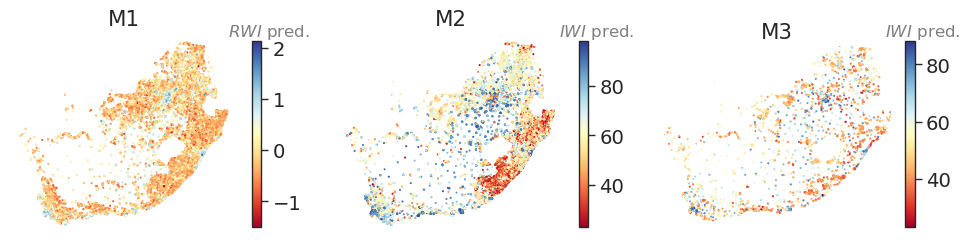

In [63]:
plot_comparison_maps(gdf_rwi, gdf_lee_mod, gdf_iwi_mod, country, OUTPUT_DIR, **kwargs_raw_map)

comparison-results/maps_ZAF_mean.pdf saved!


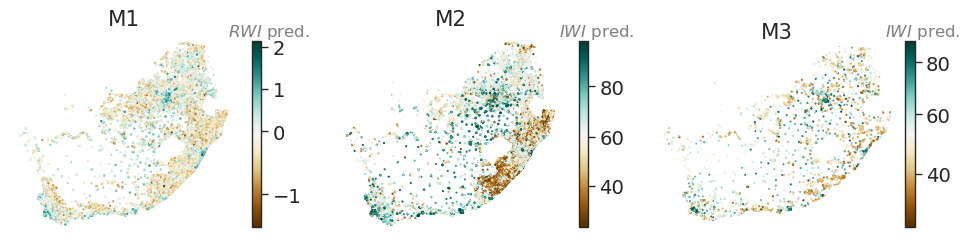

In [64]:
plot_comparison_maps(gdf_rwi, gdf_lee_mod, gdf_iwi_mod, country, OUTPUT_DIR, **kwargs_mean)

comparison-results/maps_ZAF_rescale.pdf saved!


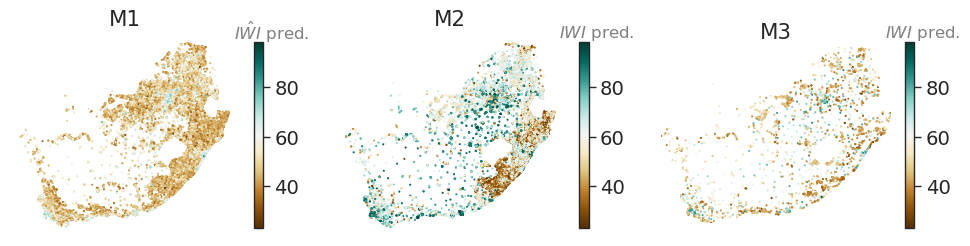

In [65]:
plot_comparison_maps(gdf_rwi, gdf_lee_mod, gdf_iwi_mod, country, OUTPUT_DIR, **kwargs_rescale)

comparison-results/maps_ZAF_rescale_mean.pdf saved!


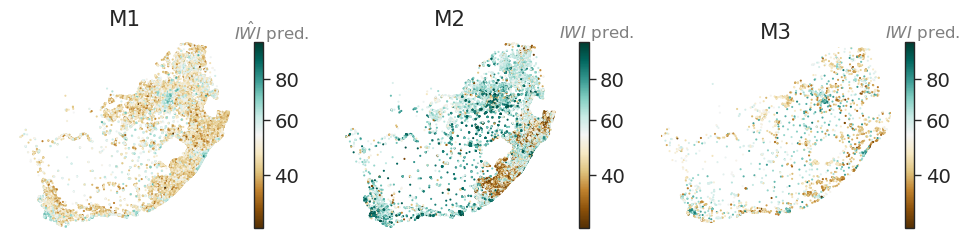

In [66]:
plot_comparison_maps(gdf_rwi, gdf_lee_mod, gdf_iwi_mod, country, OUTPUT_DIR, **kwargs_rescale_mean)

comparison-results/maps_ZAF_rescale_mean_admin2.pdf saved!


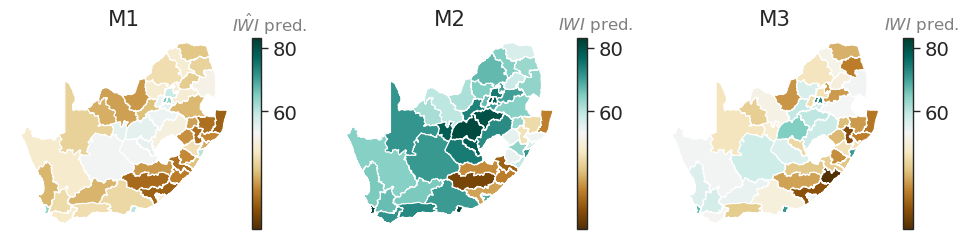

In [67]:
plot_comparison_admin_maps(gdf_rwi, gdf_lee, gdf_iwi, country, BOUNDARY_FN, ADMIN_LEVEL2, OUTPUT_DIR, **kwargs_admin)

comparison-results/maps_ZAF_rescale_mean_admin1.pdf saved!


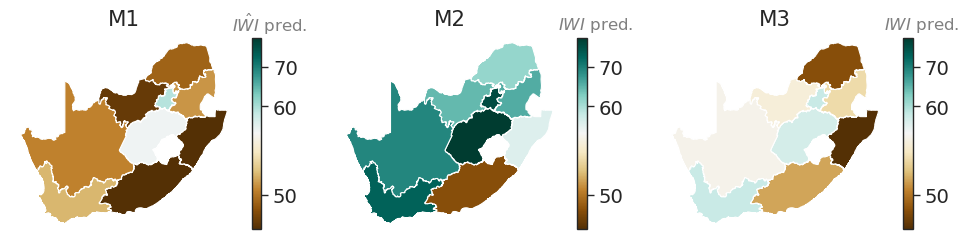

In [68]:
plot_comparison_admin_maps(gdf_rwi, gdf_lee, gdf_iwi, country, BOUNDARY_FN, ADMIN_LEVEL1, OUTPUT_DIR, **kwargs_admin)

comparison-results/dist_ZAF.pdf saved!


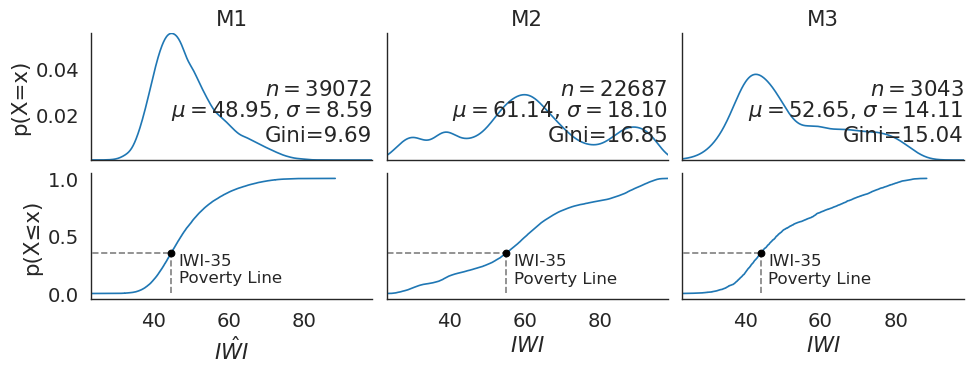

In [69]:
plot_comparison_dist(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_dist)

comparison-results/samecells_ZAF_iwi_rwi.pdf saved!


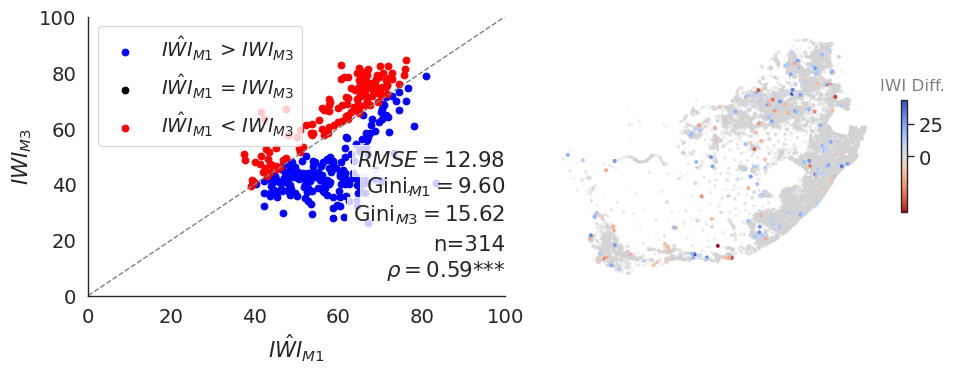

In [70]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee_mod, gdf_iwi=gdf_iwi_mod, country=country, sources=('iwi','rwi'), output_dir=OUTPUT_DIR, **kwargs_overlap)

[WARNING] 2865 2865 2685 computing mean...
comparison-results/samecells_ZAF_iwi_lee.pdf saved!


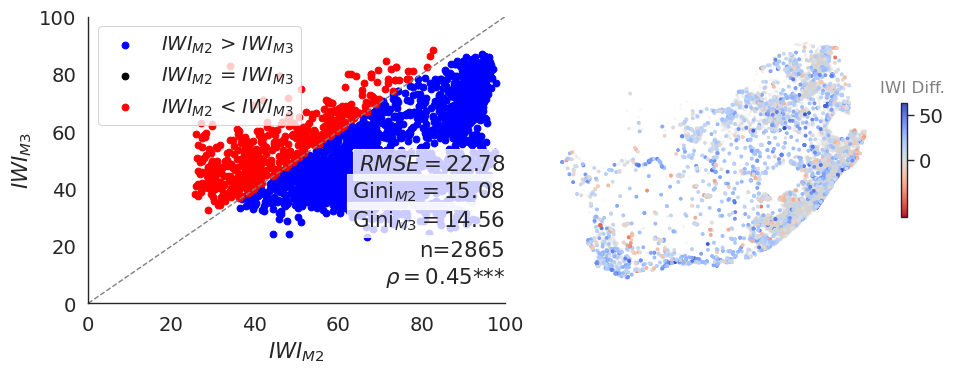

In [71]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee_mod, gdf_iwi=gdf_iwi_mod, country=country, sources=('iwi','lee'), output_dir=OUTPUT_DIR, **kwargs_overlap)

[WARNING] 2674 2587 2674 computing mean...
comparison-results/samecells_ZAF_lee_rwi.pdf saved!


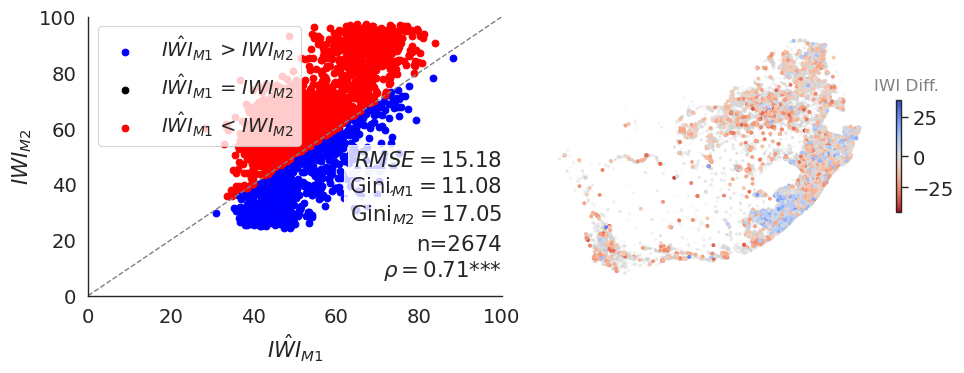

In [72]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee_mod, gdf_iwi=gdf_iwi_mod, country=country, sources=('lee','rwi'), output_dir=OUTPUT_DIR, **kwargs_overlap)

# Gabon

In [73]:
country = 'Gabon'
gdf_rwi, gdf_lee, gdf_iwi = load_rwi_lee_iwi(country, best_models[country], features_source, RWI_PRED_PATH, LEE_PRED_PATH, IWI_PRED_PATH, rescale=RESCALE)

comparison-results/maps_GAB_None.pdf saved!


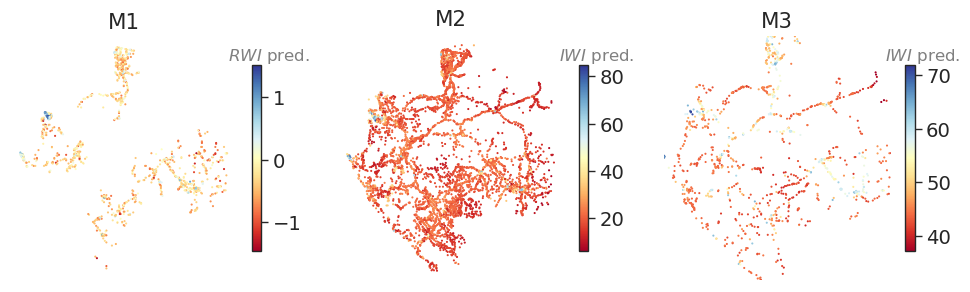

In [74]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_raw_map)

comparison-results/maps_GAB_mean.pdf saved!


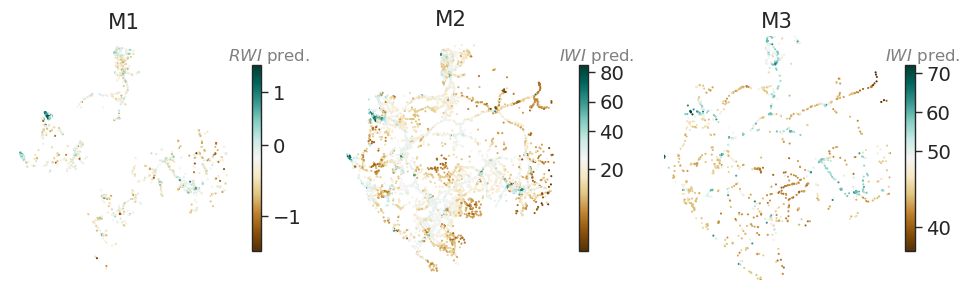

In [75]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_mean)

comparison-results/maps_GAB_rescale.pdf saved!


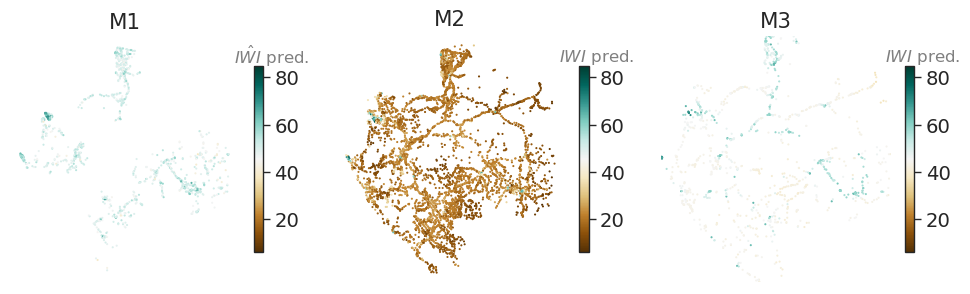

In [76]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_rescale)

comparison-results/maps_GAB_rescale_mean.pdf saved!


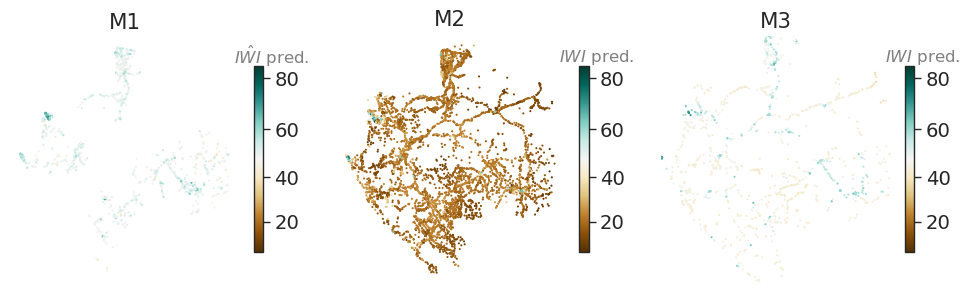

In [77]:
plot_comparison_maps(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_rescale_mean)

comparison-results/maps_GAB_rescale_mean_admin2.pdf saved!


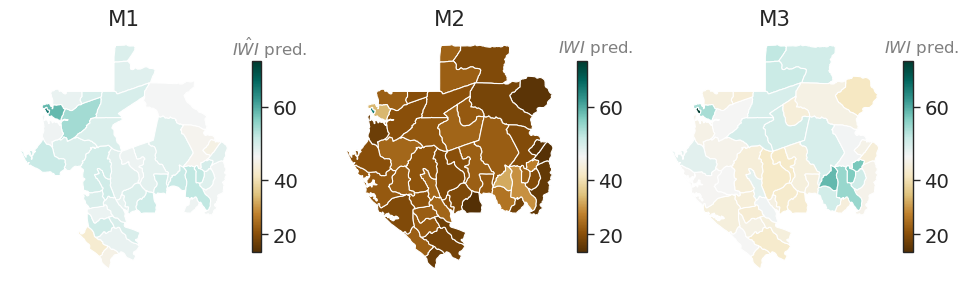

In [78]:
plot_comparison_admin_maps(gdf_rwi, gdf_lee, gdf_iwi, country, BOUNDARY_FN, ADMIN_LEVEL2, OUTPUT_DIR, **kwargs_admin)

comparison-results/maps_GAB_rescale_mean_admin1.pdf saved!


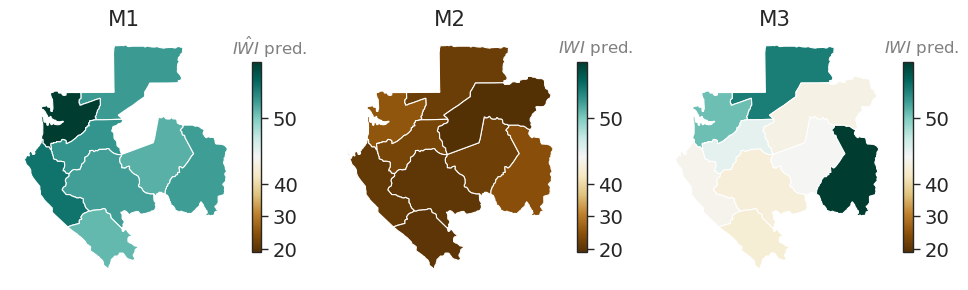

In [79]:
plot_comparison_admin_maps(gdf_rwi, gdf_lee, gdf_iwi, country, BOUNDARY_FN, ADMIN_LEVEL1, OUTPUT_DIR, **kwargs_admin)

comparison-results/dist_GAB.pdf saved!


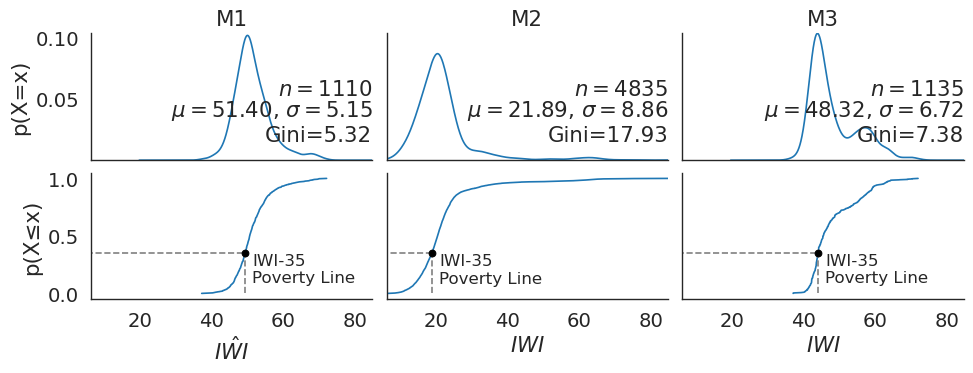

In [80]:
plot_comparison_dist(gdf_rwi, gdf_lee, gdf_iwi, country, OUTPUT_DIR, **kwargs_dist)

comparison-results/samecells_GAB_iwi_rwi.pdf saved!


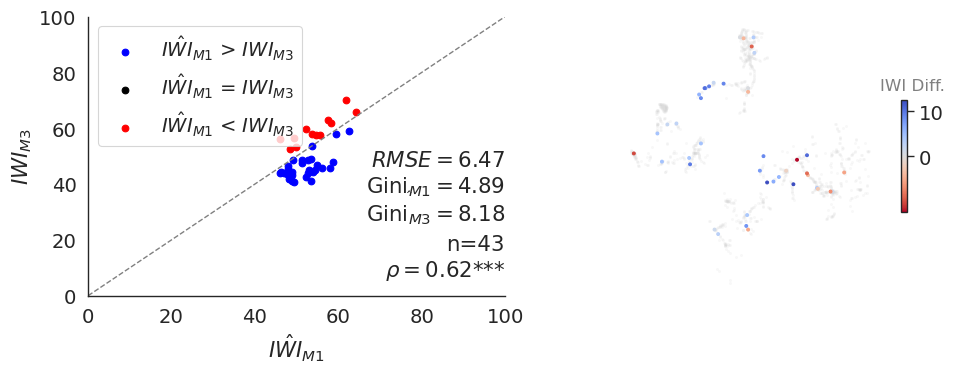

In [81]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee, gdf_iwi=gdf_iwi, country=country, sources=('iwi','rwi'), output_dir=OUTPUT_DIR, **kwargs_overlap)

[WARNING] 598 598 581 computing mean...
comparison-results/samecells_GAB_iwi_lee.pdf saved!


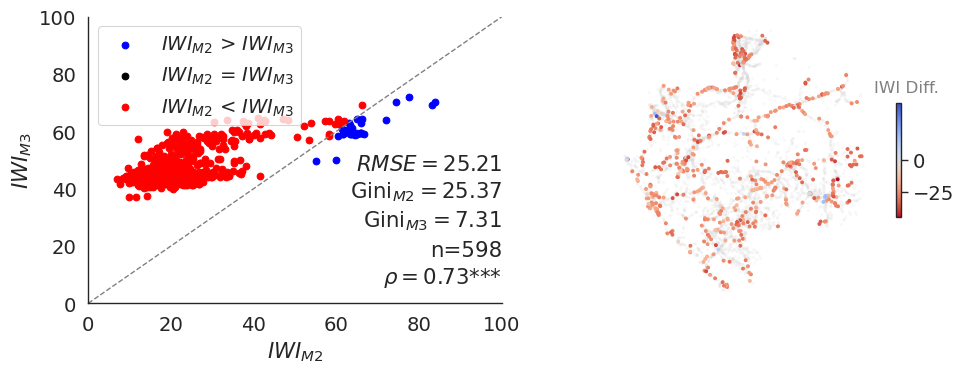

In [82]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee, gdf_iwi=gdf_iwi, country=country, sources=('iwi','lee'), output_dir=OUTPUT_DIR, **kwargs_overlap)

comparison-results/samecells_GAB_lee_rwi.pdf saved!


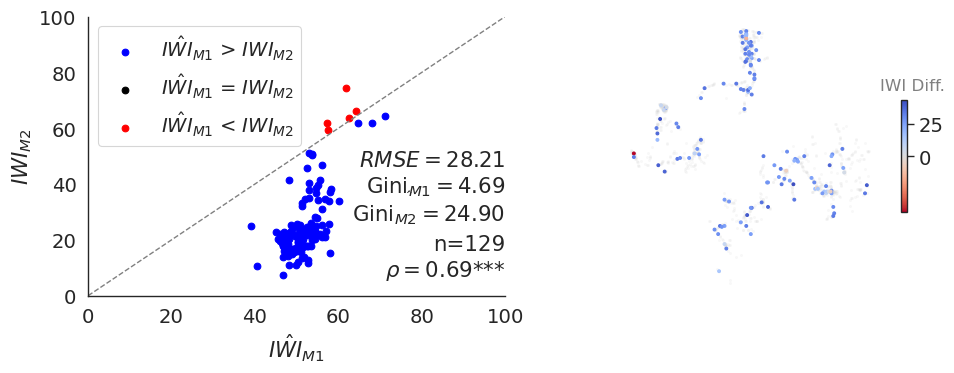

In [83]:
plot_comparison_overlapping_cells(gdf_rwi=gdf_rwi, gdf_lee=gdf_lee, gdf_iwi=gdf_iwi, country=country, sources=('lee','rwi'), output_dir=OUTPUT_DIR, **kwargs_overlap)

____